In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import os
import time
import shutil
import torch.nn as nn
from skimage import io
import torchvision
import cv2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler
from albumentations.pytorch import ToTensor
from torchvision import utils
from albumentations import (HorizontalFlip, ShiftScaleRotate, VerticalFlip, Normalize,Flip,
                            Compose, GaussNoise)


device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [2]:
csv_path = 'D:\Philippe\ProjectIMGPRO/train.csv'
train_dir = 'D:\Philippe\ProjectIMGPRO/train'

In [3]:
df = pd.read_csv(csv_path)
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [4]:
print(f'Total number of train images is {len(os.listdir(train_dir))}')
print(f'shape of dataframe is {df.shape}')
print(f'Number of images in dataframe is {len(np.unique(df["image_id"]))}')
print(f'Number of train images with no bounding boxes {len(os.listdir(train_dir)) - len(np.unique(df["image_id"]))}')

Total number of train images is 3422
shape of dataframe is (147793, 5)
Number of images in dataframe is 3373
Number of train images with no bounding boxes 49


In [5]:
# this function will take the dataframe and vertically stack the image ids 
# with no bounding boxes
def process_bbox(df):
    df['bbox'] = df['bbox'].apply(lambda x: eval(x))
    df['x'] = df['bbox'].apply(lambda x: x[0])
    df['y'] = df['bbox'].apply(lambda x: x[1])
    df['w'] = df['bbox'].apply(lambda x: x[2])
    df['h'] = df['bbox'].apply(lambda x: x[3])
    df['x'] = df['x'].astype(np.float)
    df['y'] = df['y'].astype(np.float)
    df['w'] = df['w'].astype(np.float)
    df['h'] = df['h'].astype(np.float)

    df.drop(columns=['bbox'],inplace=True)
#     df.reset_index(drop=True)
    return df

In [6]:
df_new = process_bbox(df)
print(f'shape of dataframe after prerpocessing {df_new.shape}')
df_new.tail()

shape of dataframe after prerpocessing (147793, 8)


,image_id,width,height,source,x,y,w,h
147788,5e0747034,1024,1024,arvalis_2,64.0,619.0,84.0,95.0
147789,5e0747034,1024,1024,arvalis_2,292.0,549.0,107.0,82.0
147790,5e0747034,1024,1024,arvalis_2,134.0,228.0,141.0,71.0
147791,5e0747034,1024,1024,arvalis_2,430.0,13.0,184.0,79.0
147792,5e0747034,1024,1024,arvalis_2,875.0,740.0,94.0,61.0


In [7]:
image_ids = df_new['image_id'].unique()
train_ids = image_ids[0:int(0.8*len(image_ids))]
val_ids = image_ids[int(0.8*len(image_ids)):]
print(f'Total images {len(image_ids)}')
print(f'No of train images {len(train_ids)}')
print(f'No of validation images {len(val_ids)}')


Total images 3373
No of train images 2698
No of validation images 675


In [8]:
train_df = df_new[df_new['image_id'].isin(train_ids)]
val_df = df_new[df_new['image_id'].isin(val_ids)]

In [9]:
def get_transforms(phase):
            list_transforms = []
            if phase == 'train':
                list_transforms.extend([
                       Flip(p=0.5)
                         ])
            list_transforms.extend(
                    [
            ToTensor(),
                    ])
            list_trfms = Compose(list_transforms,
                                 bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
            return list_trfms

In [10]:
class Wheatset(Dataset):
    def __init__(self,data_frame,image_dir,phase='train'):
        super().__init__()
        self.df = data_frame
        self.image_dir = image_dir
        self.images = data_frame['image_id'].unique()
        self.transforms = get_transforms(phase)
        
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self,idx):
        image = self.images[idx] + '.jpg'
#         image_arr = io.imread(os.path.join(self.image_dir,image))
        
        image_arr = cv2.imread(os.path.join(self.image_dir,image), cv2.IMREAD_COLOR)
        image_arr = cv2.cvtColor(image_arr, cv2.COLOR_BGR2HSV).astype(np.uint8)
        H,S,V = cv2.split(image_arr)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(32,32))
        V = clahe.apply(V)
        S = clahe.apply(S)
        image_arr = cv2.merge((H, S, V))
        image_arr = cv2.cvtColor(image_arr, cv2.COLOR_HSV2RGB).astype(np.float32)
        image_arr /= 255
        
        image_id = str(image.split('.')[0])
        point = self.df[self.df['image_id'] == image_id]
        boxes = point[['x', 'y', 'w', 'h']].values
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
        
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        # there is only one class
        labels = torch.ones((point.shape[0],), dtype=torch.int64)
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((point.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['image_id'] = torch.tensor(idx)
        target['area'] = area
        target['iscrowd'] = iscrowd
        
        if self.transforms:
            sample = {
                'image': image_arr,
                'bboxes': target['boxes'],
                'labels': target['labels']
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
        target['boxes'] = torch.stack(tuple(map(torch.tensor, 
                                                zip(*sample['bboxes'])))).permute(1, 0)
        
        return image, target, image_id

In [11]:
train_data = Wheatset(train_df,train_dir,phase='train')
val_data = Wheatset(val_df,train_dir,phase='validation')

print(f'Length of train data {len(train_data)}')
print(f'Length of validation data {len(val_data)}')

Length of train data 2698
Length of validation data 675


In [12]:
# batching
def collate_fn(batch):
    return tuple(zip(*batch))

train_data_loader = DataLoader(
    train_data,
    batch_size=2,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    val_data,
    batch_size=2,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

In [13]:
def image_convert(image):
    image = image.clone().cpu().numpy()
    image = image.transpose((1,2,0))
    image = (image * 255).astype(np.uint8)
    return image

def plot_img(data,idx):
    out = data.__getitem__(idx)
    image = image_convert(out[0])
    image = np.ascontiguousarray(image)
    bb = out[1]['boxes'].numpy()
    for i in bb:
        cv2.rectangle(image, (int(i[0]),int(i[1])), (int(i[2]),int(i[3])), (255,255,255), thickness=2)
    plt.figure(figsize=(10,10))
    plt.imshow(image[:,:,:])

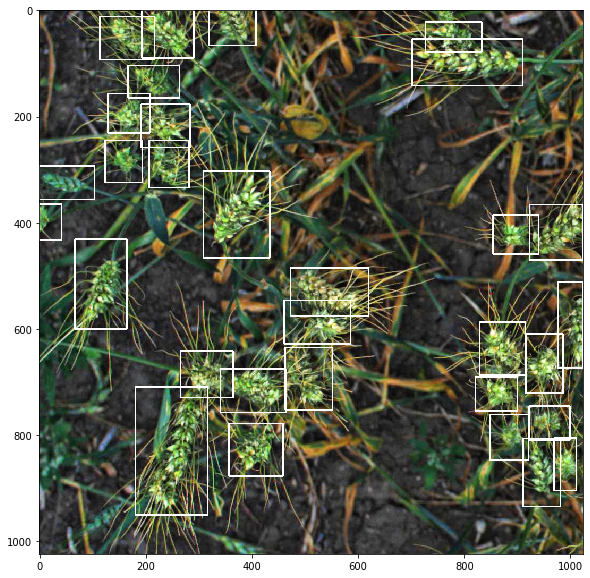

In [14]:
plot_img(train_data,101)

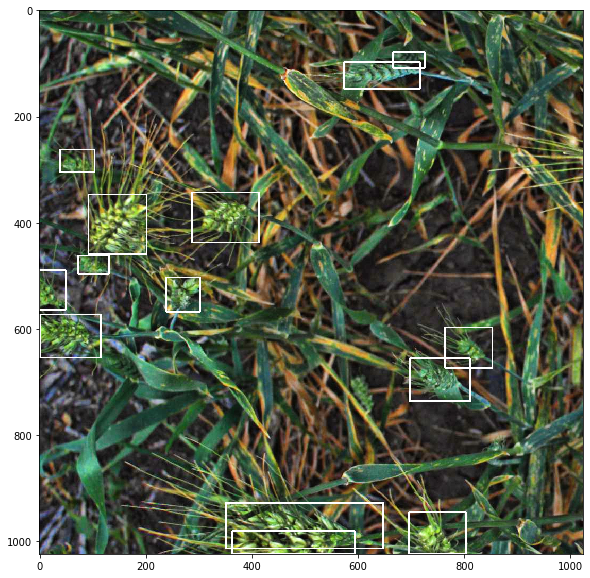

In [15]:
plot_img(train_data,40)

In [16]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

In [17]:
num_classes = 2  # 1 class (wheat) + background

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)



In [18]:
images, targets, ids = next(iter(train_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

In [19]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# optimizer = torch.optim.Adam(params, lr=0.001)
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

In [20]:
num_epochs = 7
train_loss_min = 0.9
total_train_loss = []
total_val_loss = []


checkpoint_path = '/kaggle/working/chkpoint_'
best_model_path = '/kaggle/working/bestmodel_may12.pt'
pl = 0
for epoch in range(num_epochs):
    print(f'Epoch :{epoch + 1}')
    start_time = time.time()
    train_loss = []
    
    model.train()
    for images, targets, image_ids in train_data_loader:
        
        pl += 1
        if pl%30 == 0:
            print(pl/3000)
            
        images = list(image.to(device=device, dtype=torch.float) for image in images)
        targets = [{k: v.to(device=device, dtype=torch.int64) for k, v in t.items()} for t in targets]
        
        loss_dict = model(images, targets)
        
        losses = sum(loss for loss in loss_dict.values())
        
        train_loss.append(losses.item())     
        
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    #train_loss/len(train_data_loader.dataset)
    epoch_train_loss = np.mean(train_loss)
    total_train_loss.append(epoch_train_loss)
    i=0
    val_loss = []
    for imagesV, targetsV, image_idsV in valid_data_loader:
        i+=1
        if i%20==0:
            print(i/675)
        
        imagesV = list(image.to(device=device, dtype=torch.float) for image in imagesV)
        targetsV = [{k: v.to(device=device, dtype=torch.int64) for k, v in t.items()} for t in targetsV]
        
        loss_dict_val = model(imagesV, targetsV)
        #print(loss_dict_val)
        lossesV = sum(loss for loss in loss_dict_val.values()).item()
        del(loss_dict_val)
        val_loss.append(lossesV) 
    
            
    val_loss_final = np.mean(val_loss)
    total_val_loss.append(val_loss_final)

    
    print(f'Epoch train loss is train : {epoch_train_loss}')
    
#     if lr_scheduler is not None:
#         lr_scheduler.step()
    
    
    time_elapsed = time.time() - start_time
    print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))


Epoch :1


C:\Users\Philippe\Anaconda3\lib\site-packages\torch\nn\functional.py:2854: UserWarning: The default behavior for interpolate/upsample with float scale_factor will change in 1.6.0 to align with other frameworks/libraries, and use scale_factor directly, instead of relying on the computed output size. If you wish to keep the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  warnings.warn("The default behavior for interpolate/upsample with float scale_factor will change "
..\torch\csrc\utils\python_arg_parser.cpp:756: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple)


0.01
0.02
0.03
0.04
0.05
0.06
0.07
0.08
0.09
0.1
0.11
0.12
0.13
0.14
0.15
0.16
0.17
0.18
0.19
0.2
0.21
0.22
0.23
0.24
0.25
0.26
0.27
0.28
0.29
0.3
0.31
0.32
0.33
0.34
0.35
0.36
0.37
0.38
0.39
0.4
0.41
0.42
0.43
0.44
0.02962962962962963
0.05925925925925926
0.08888888888888889
0.11851851851851852
0.14814814814814814
0.17777777777777778
0.2074074074074074
0.23703703703703705
0.26666666666666666
0.2962962962962963
0.32592592592592595
0.35555555555555557
0.3851851851851852
0.4148148148148148
0.4444444444444444
0.4740740740740741
Epoch train loss is train : 0.6951002833289159
22m 20s
Epoch :2
0.45
0.46
0.47
0.48
0.49
0.5
0.51
0.52
0.53
0.54
0.55
0.56
0.57
0.58
0.59
0.6
0.61
0.62
0.63
0.64
0.65
0.66
0.67
0.68
0.69
0.7
0.71
0.72
0.73
0.74
0.75
0.76
0.77
0.78
0.79
0.8
0.81
0.82
0.83
0.84
0.85
0.86
0.87
0.88
0.89
0.02962962962962963
0.05925925925925926
0.08888888888888889
0.11851851851851852
0.14814814814814814
0.17777777777777778
0.2074074074074074
0.23703703703703705
0.26666666666666666
0.2962

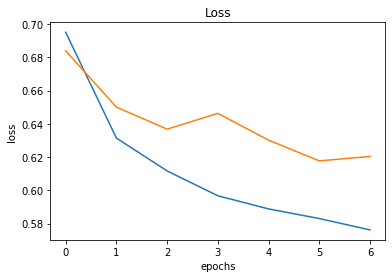

In [22]:
plt.title('Loss')
plt.plot(total_train_loss)
plt.plot(total_val_loss)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.show()

In [23]:
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequent

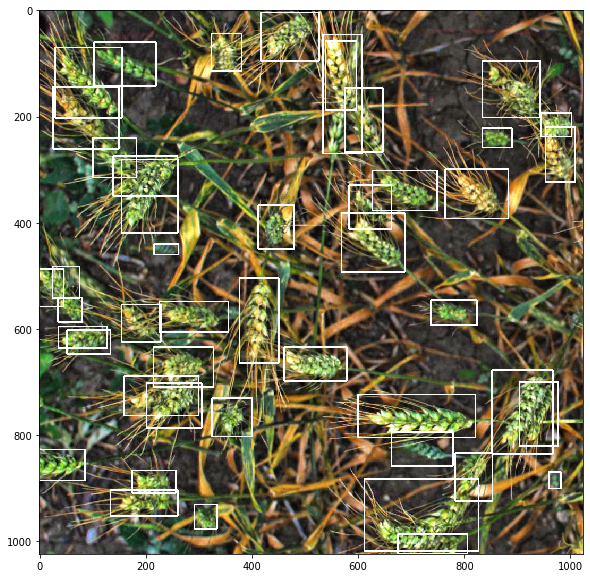

In [24]:
plot_img(train_data,0)

In [25]:
out = train_data.__getitem__(0)[0]
x = model([out.cuda()])

In [26]:
x[0]['boxes']


tensor([[ 331.7818,  528.3832,  442.7721,  626.0422],
        [  47.6233,  196.5823,  160.1215,  343.9396],
        [ 759.9887,  610.5284,  878.9198,  756.7779],
        [ 499.3600,  928.2590,  604.5456, 1018.0236],
        [ 198.8847,  211.1970,  415.0898,  289.8157],
        [ 275.9589,  645.1763,  390.2654,  720.4910],
        [ 442.7934,  321.0057,  564.6045,  391.2699],
        [ 142.7303,  627.1345,  245.7017,  718.1454],
        [ 865.6655,  822.4242,  991.3644,  944.8481],
        [ 886.8334,  369.3949,  989.0850,  432.7122],
        [ 677.0497,  416.3029,  794.4199,  481.2244],
        [ 569.6652,  370.5181,  652.3083,  528.2900],
        [ 543.1074,  575.3784,  607.9989,  650.9261],
        [ 765.1826,   63.5737,  874.1223,  158.3574],
        [ 641.1344,  896.3605,  713.0054,  982.0419],
        [ 797.8846,  884.1096,  920.5472,  957.7880],
        [ 796.7205,  398.1547,  876.0167,  474.1689],
        [ 626.6483,  215.2023,  695.3532,  291.0837],
        [ 930.2289,  438.841

In [33]:
def plot_img_pred(data,idx):
    out = data.__getitem__(idx)
    x = model([out[0].cuda()])
    image = image_convert(out[0])
    image = np.ascontiguousarray(image)
    bb = x[0]['boxes'].cpu().detach().numpy()
    for i in bb:
        cv2.rectangle(image, (int(i[0]),int(i[1])), (int(i[2]),int(i[3])), (255,0,0), thickness=2)
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.show()

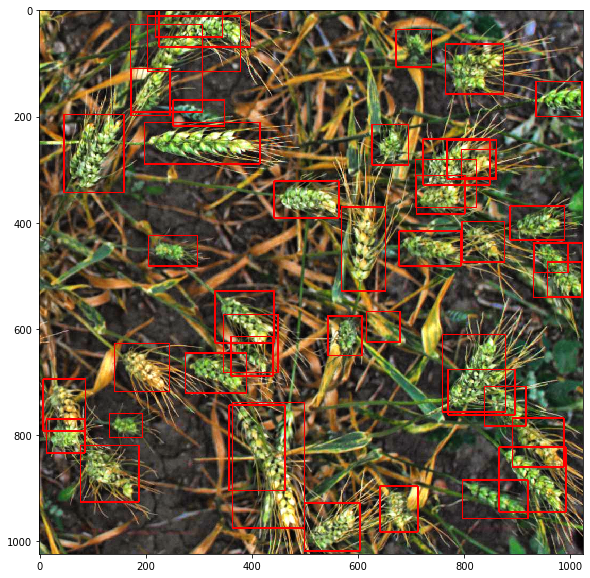

In [34]:
plot_img_pred(train_data,0)

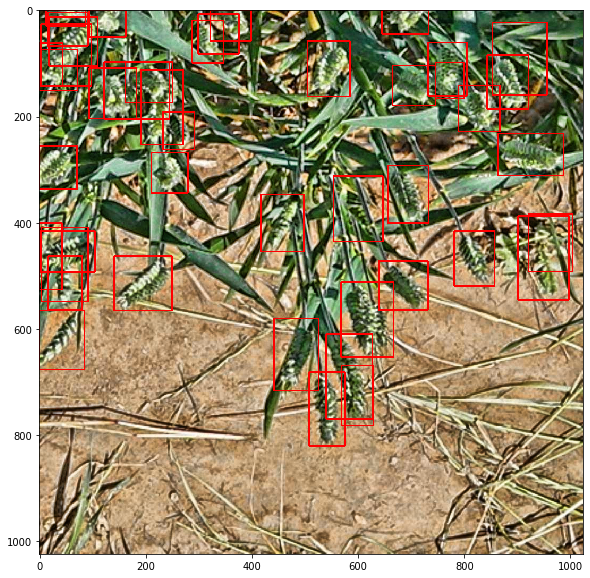

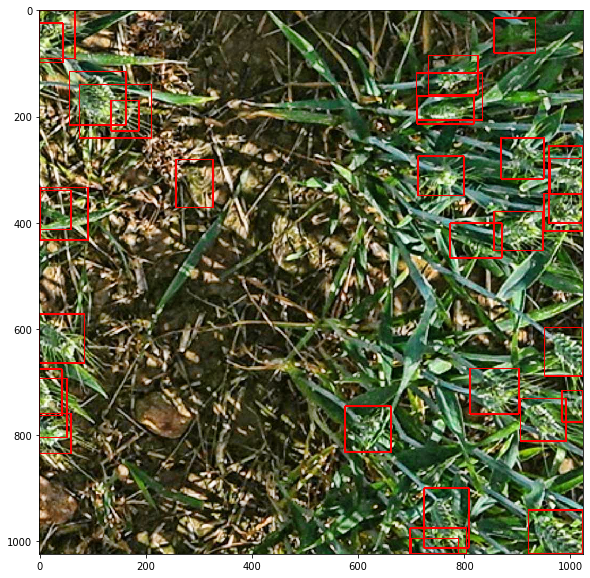

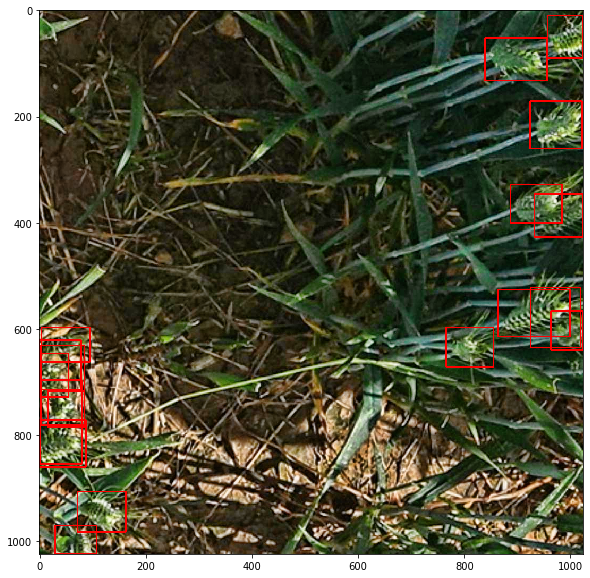

In [45]:
plot_img_pred(val_data,0)
plot_img_pred(val_data,1)
plot_img_pred(val_data,2)


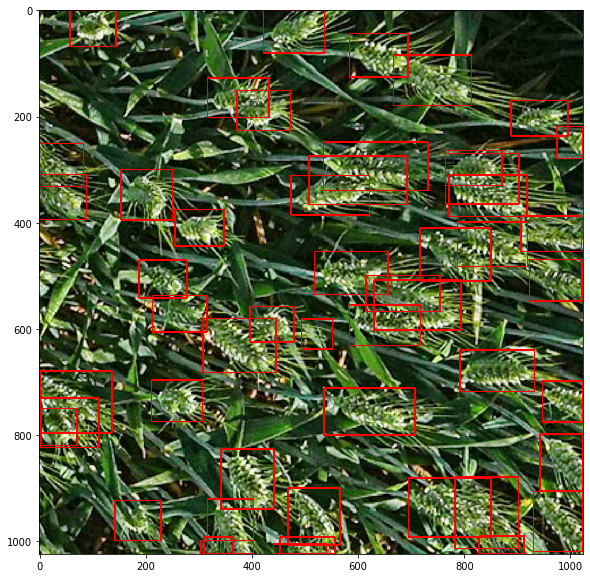

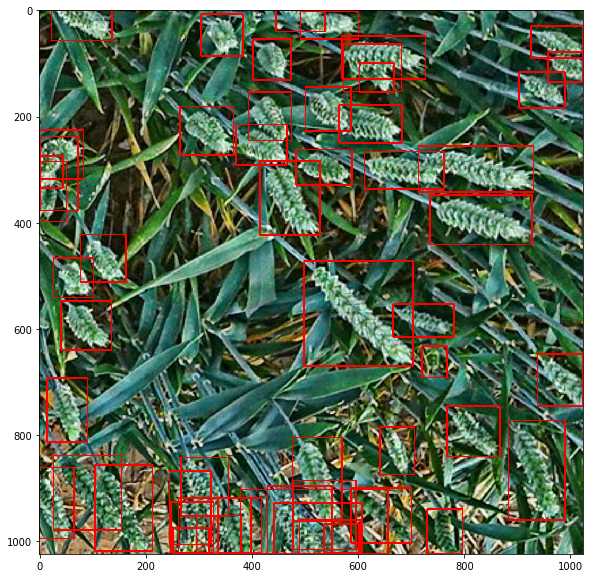

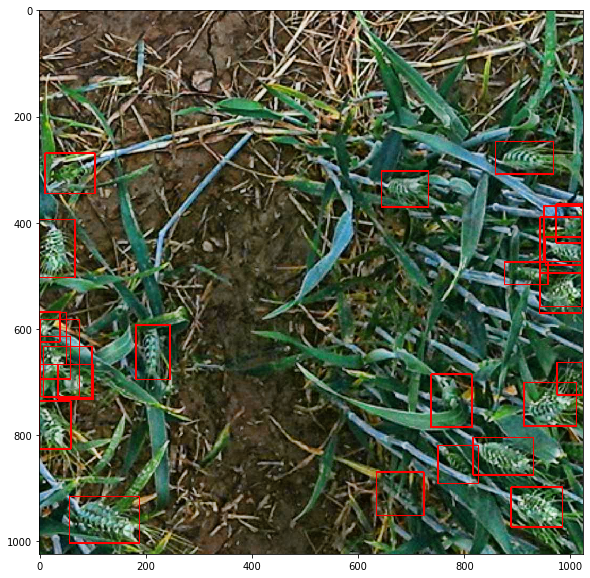

In [46]:
plot_img_pred(val_data,10)
plot_img_pred(val_data,11)
plot_img_pred(val_data,12)

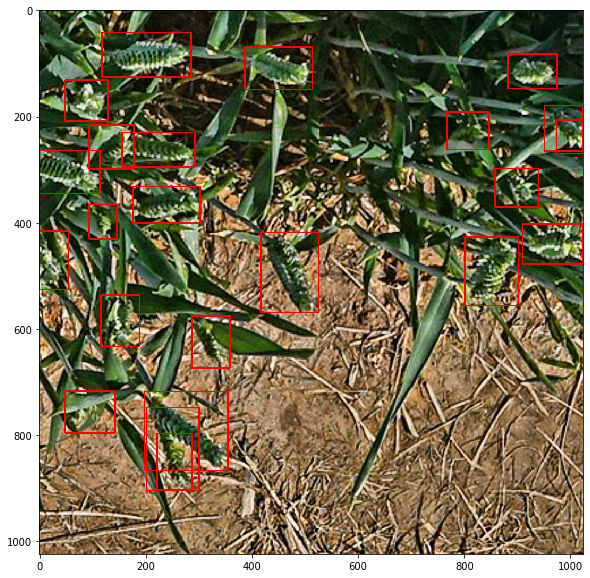

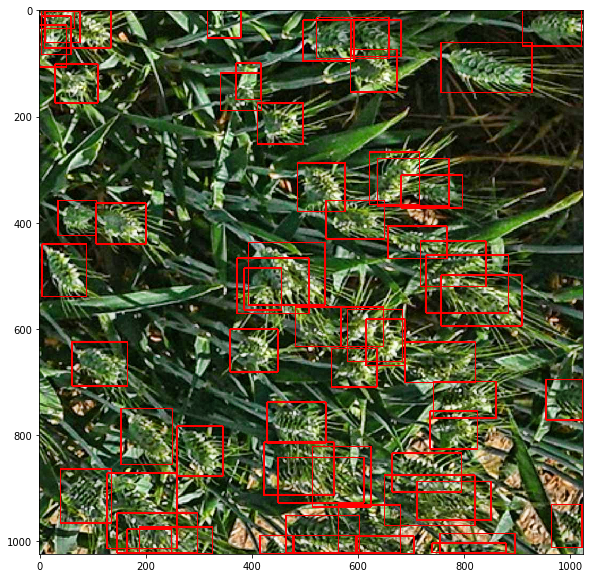

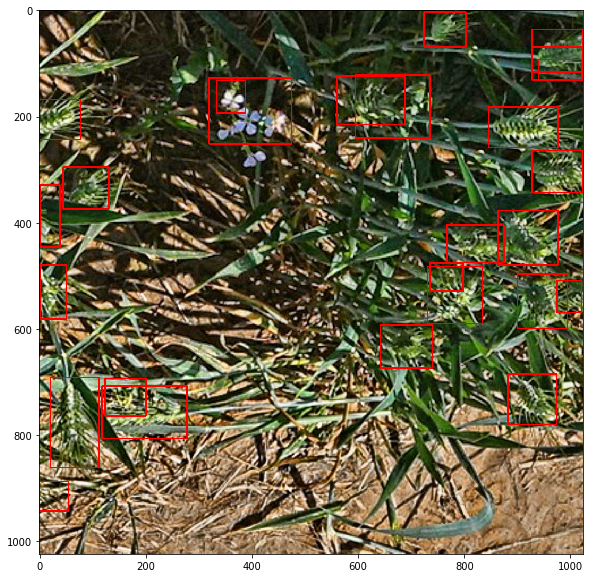

In [48]:
plot_img_pred(val_data,20)
plot_img_pred(val_data,21)
plot_img_pred(val_data,22)

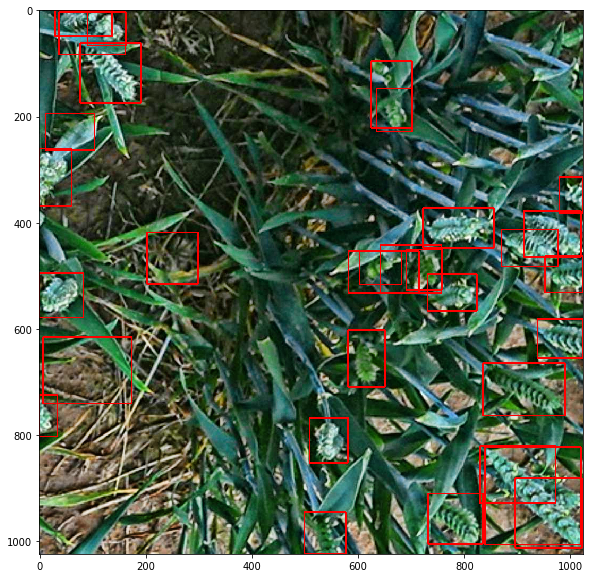

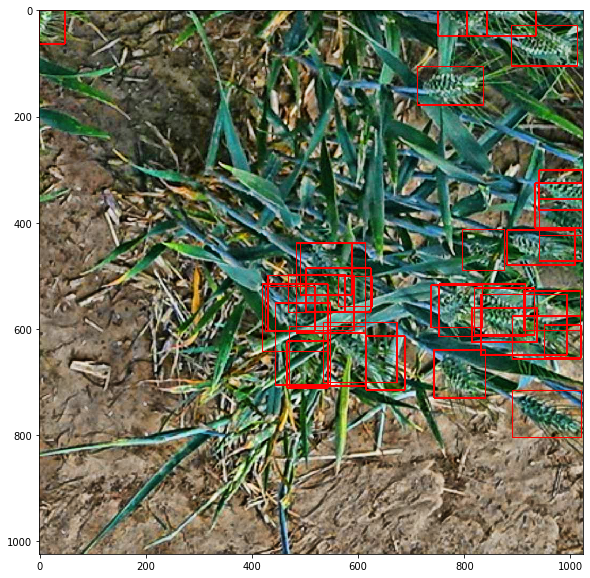

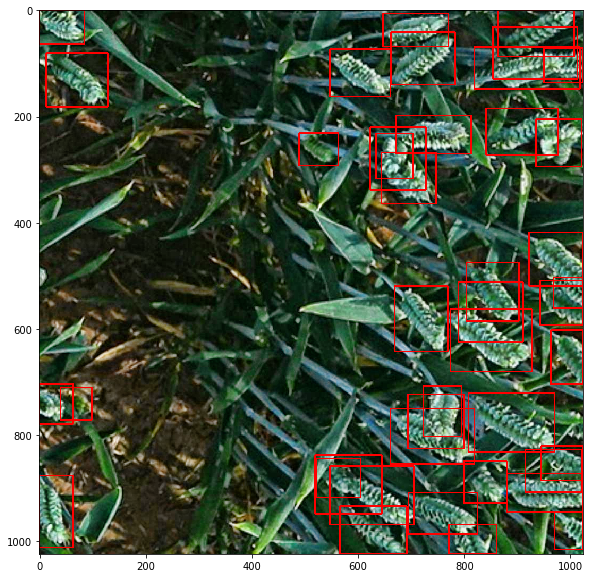

In [49]:
plot_img_pred(val_data,30)
plot_img_pred(val_data,31)
plot_img_pred(val_data,32)

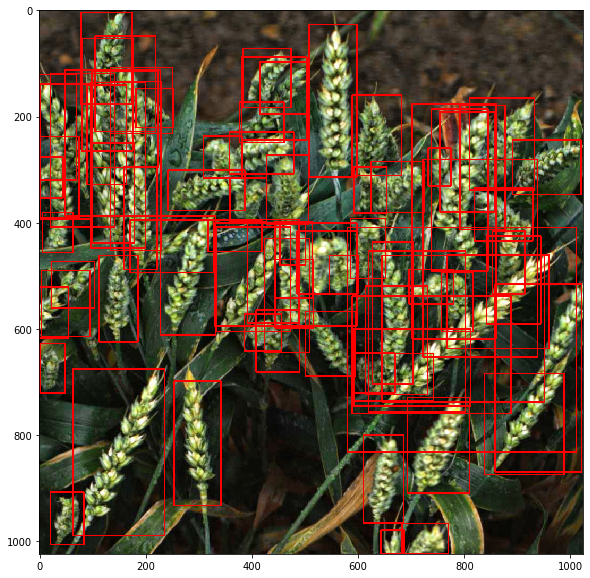

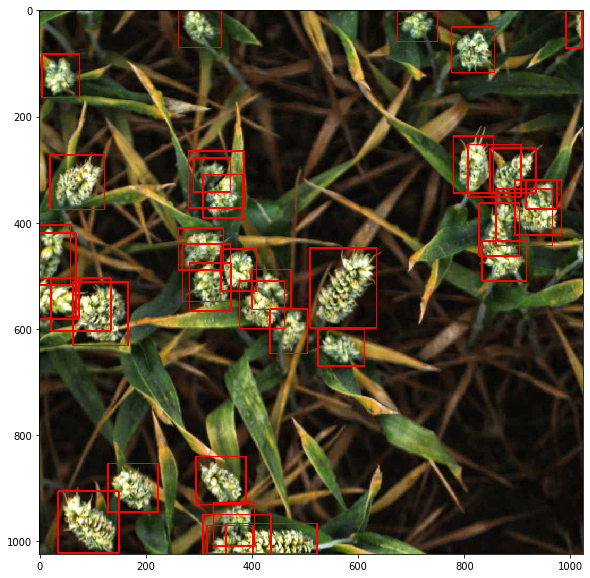

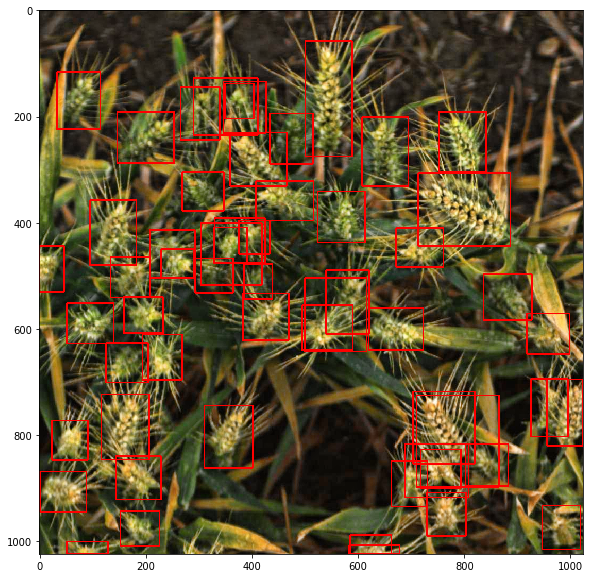

In [50]:
plot_img_pred(val_data,40)
plot_img_pred(val_data,41)
plot_img_pred(val_data,42)

In [23]:
#Inspired by : https://www.kaggle.com/arunmohan003/fasterrcnn-using-pytorch-baseline/notebook

In [30]:
torch.save(model.state_dict(), 'RGB.pth')